### 🐶 End-to-end Multil-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

1. Problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

4. Features
Some information about the data:

We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
There are 120 breeds of dogs (this means there are 120 different classes).
There are around 10,000+ images in the training set (these images have labels).
There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [1]:


# !unzip "drive/My Drive/dog-vision/dog-breed-identification.zip" -d "drive/My Drive/dog-vision/"

In [2]:
# Import TensorFlow into colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.19.0


In [3]:
import tensorflow_hub as hub
print("Hub version:", hub.__version__)

Hub version: 0.16.1


In [4]:
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


In [5]:
# Check out the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/dog-vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [6]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [7]:
labels_csv['breed'].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


<Axes: xlabel='breed'>

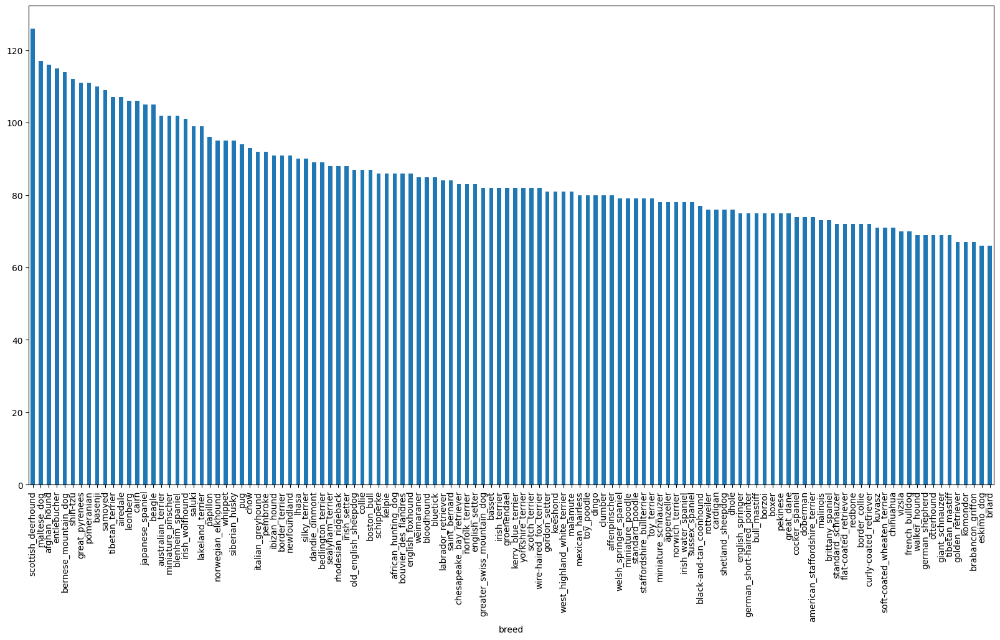

In [8]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [9]:
labels_csv["breed"].value_counts().median()

82.0

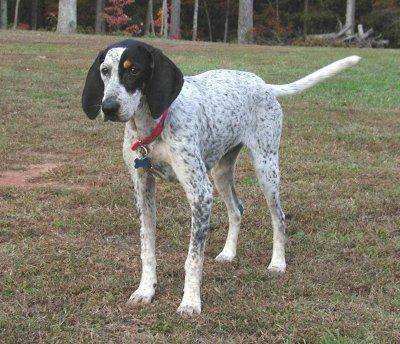

In [10]:
# Let's view an image
from IPython.display import display, Image
Image("/content/drive/MyDrive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

In [11]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [12]:
# create pathnames from images ID's
filenames = ["/content/drive/MyDrive/dog-vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# check the first 10
filenames[:10]

['/content/drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [13]:
# check whether number number of filename matches number of actual image file
import os
if len(os.listdir("/content/drive/MyDrive/dog-vision/train/")) == len(filenames):
  print("Filenames match actual amount of files")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files


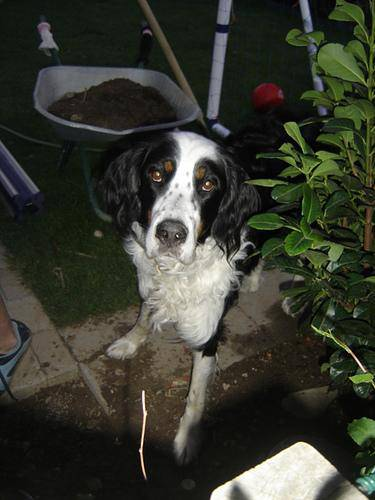

In [14]:
# one more check
Image(filenames[2000])

In [15]:
labels_csv['breed'][2000]

'appenzeller'

Since we've got our training image filepaths in a list, let's prepare our labels

In [16]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [17]:
len(labels)

10222

In [18]:
# see if number of labels matches the number of filenames
if len(labels) == len(filenames):

   print("Number of labels matches number of filenames")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames


In [19]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [20]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [21]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [22]:
len(labels)

10222

In [23]:
# turn every label into a boolean array'
boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [24]:
len(boolean_labels)

10222

In [25]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [26]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [27]:
 filenames[:10]

['/content/drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

Create validation set


In [28]:
X = filenames
y = boolean_labels

In [29]:
len(filenames)
len(boolean_labels)

10222

We're going to experiment with ~1000 images and increase as needed

In [30]:
# Set number of images to use for experimenting
NUM_IMAGES = 5000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [31]:
# Split into train and validation sets
from sklearn.model_selection import train_test_split

np.random.seed(42)

# split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(4000, 4000, 1000, 1000)

In [32]:
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/dog-vision/train/693f4cd00978df07e1283d3da4d02e0c.jpg',
  '/content/drive/MyDrive/dog-vision/train/7521421e092333c78d6b9dc2e189e659.jpg',
  '/content/drive/MyDrive/dog-vision/train/13d42ef52eb6c649c14cb9ffa8b6fba4.jpg',
  '/content/drive/MyDrive/dog-vision/train/5b93fe30e02f555ff6c3ae5e050dd752.jpg',
  '/content/drive/MyDrive/dog-vision/train/685cda6503bd2f2d282d7e9b7ceb33c5.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

Preprocessing Images (turning images into Tensors)
To preprocess our images into Tensors we're going to write a function which does a few things:

- Take an image filepath as input

- Use TensorFlow to read the file and save it to a variable, image
   
- Turn our image (a jpg) into Tensors

- Normalize our image (convert color channel values from from 0-255 to 0-1).

- Resize the image to be a shape of (224, 224)

- Return the modified image

Before we do, let's see what importing an image looks like.

In [33]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [34]:
image.max(), image.min()


(np.uint8(255), np.uint8(0))

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
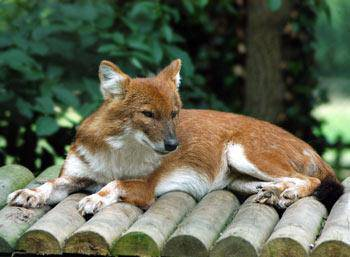

In [35]:
image

In [36]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [37]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [38]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [39]:
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [40]:
tensor = tf.image.decode_jpeg(tensor, channels=3)

In [41]:
tf.image.convert_image_dtype(tensor, tf.float32)

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

### Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: (image, label).


In [42]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [43]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Turn the data into tuples of tensors in the form: (image, label)

In [101]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [45]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [46]:

# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))


Visualizing Data Batches

In [47]:
import matplotlib.pyplot as plt

# create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Displays a plot of 25 images and their labels from a data batch.
  '''

  # setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # turn the grid lines off
    plt.axis("off")

In [48]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

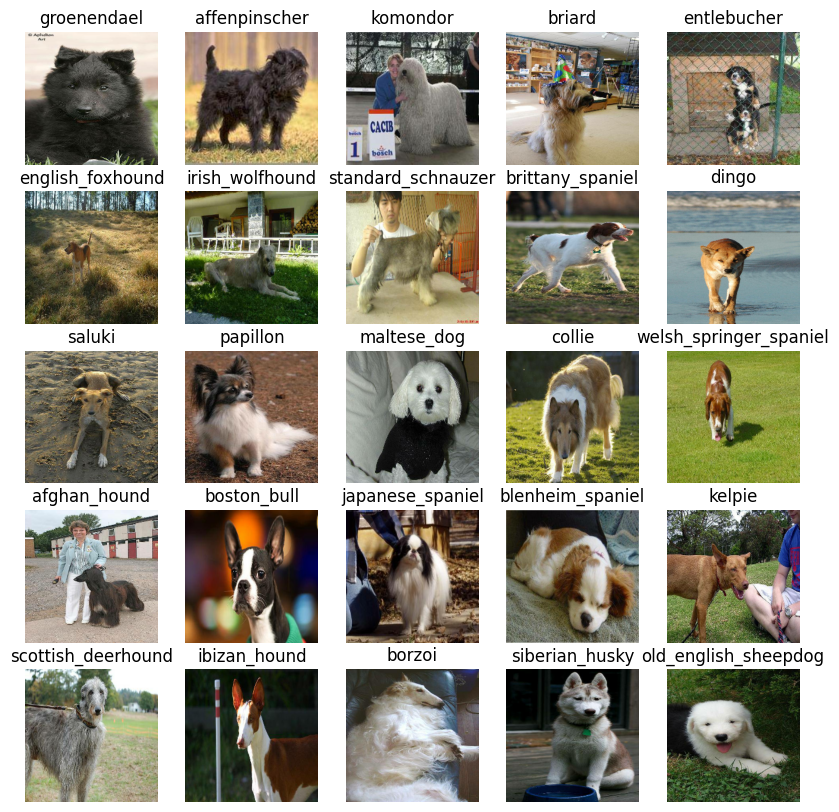

In [49]:
# now lets visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

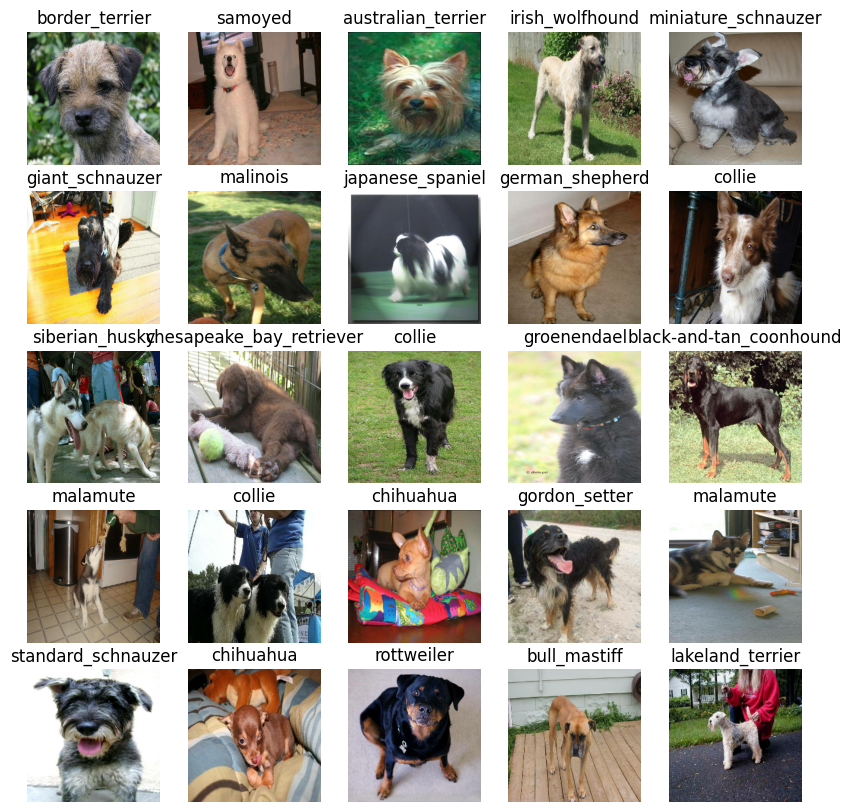

In [50]:
# now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [51]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [52]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

## Building a model

Before we build a model, we need to define:
* The input shape (our images shape, in the form of Tensors) to our model
* The output shape (image labels, in the form of Tensors) of our model
* The URL of the model we want to use: "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

In [53]:
IMG_SIZE

224

In [54]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

Put all together in a keras deep learning model

Create a function which:
* Takes the input shape, output shape and the model we,ve chosen as parameters.
* Defines the layers in a keras model in sequential fashion.
* Compiles the model (evaluation and improvement)
* Builds

In [55]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras import layers
from tensorflow.keras.models import load_model

# Define image shape constant
IMAGE_SHAPE = (224, 224)

# Define the link for the MobileNetV2 model from TensorFlow Hub
mobilenet_v2_link = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

# Create a KerasLayer from the TensorFlow Hub model
# We set trainable=False to use it as a fixed feature extractor
mobilenet_v2_layer = hub.KerasLayer(mobilenet_v2_link,
                                     trainable=False,
                                     name="mobilenet_v2")

# Define a custom layer that wraps the hub.KerasLayer
# This is good practice for saving and loading custom models
class MobileNetv2(layers.Layer):
    def call(self, inputs):
        return mobilenet_v2_layer(inputs)

def create_model(num_classes=120):
    """
    Creates and returns a MobileNetV2-based model for image classification.

    Args:
        num_classes (int): Number of output classes for classification

    Returns:
        tf.keras.Model: Compiled model ready for training
    """
    # Define the Sequential model
    model = tf.keras.Sequential([
        # Input layer specifying the shape of the images
        layers.Input(shape=(224, 224, 3)),

        # Apply the custom MobileNetV2 feature extraction layer
        MobileNetv2(),

        # Add a few dense layers for custom classification
        layers.Dense(128, activation='relu'),
        layers.Dense(64, activation='relu'),

        # Output layer with softmax activation for multi-class classification
        # The number of units matches the number of classes
        layers.Dense(num_classes, activation='softmax')
    ])

    # Compile the model with categorical crossentropy for multi-class classification
    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    # Print model summary for verification
    print("Model Summary:")
    model.summary()

    return model

# Example usage:
if __name__ == "__main__":
    # Create a model with 10 classes (adjust as needed)
    model = create_model(num_classes=120)

    # The model summary will be automatically displayed when the function runs

Model Summary:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobile_netv2 (MobileNetv2)      │ (None, 1001)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       128,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 120)            │         7,800 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 144,312 (563.72 KB)

 Trainable params: 144,312 (563.72 KB)

 Non-trainable params: 0 (0.00 B)

## Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as its save progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback

To set up a TensorBoard callback, we need to do 3 things:

> 1. Load the TensorBoard notebook extension

> 2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.

> 3. Visualize our model's training logs with the %tensorboard magic function (we'll do this after model training).





In [56]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [57]:
import datetime
 # Create a function to build a TensorBoard callback
def create_tensorboard_callback():
   # Create a log directory for storing TensorBoard logs
    logdir = os.path.join("drive/My Drive/dog-vision/logs",
                          # Make it so the logs get tracked whenever we run an experiment
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    return tf.keras.callbacks.TensorBoard(logdir)

In [58]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)
Train on 1000 images

In [59]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100, step:10}

## Create a model using create_model()

* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [60]:
def train_model():
    """
    Trains a given model and returns the trained version.
    """
    # Create a model with the correct number of classes
    model = create_model(num_classes=120)

    # Create new TensorBoard session everytime we train a model
    tensorboard = create_tensorboard_callback()

    # Fit the model to the data passing it the callbacks we created
    model.fit(x=train_data,
              epochs=NUM_EPOCHS,
              validation_data=val_data,
              validation_freq=1,
              callbacks=[tensorboard, early_stopping])

    # Return the fitted model
    return model

In [61]:
# Debug your data shapes
print("=== Data Shape Debug ===")
for images, labels in train_data.take(1):
    print(f"Image batch shape: {images.shape}")
    print(f"Label batch shape: {labels.shape}")
    print(f"First label: {labels[0]}")
    print(f"Number of classes detected: {labels.shape[-1] if len(labels.shape) > 1 else 'Unknown'}")

=== Data Shape Debug ===
Image batch shape: (32, 224, 224, 3)
Label batch shape: (32, 120)
First label: [False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False  True False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]
Number of classes detected: 120


In [62]:
# Fit the model to the data
model = train_model()

Model Summary:


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobile_netv2_1 (MobileNetv2)    │ (None, 1001)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │       128,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 120)            │         7,800 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 144,312 (563.72 KB)

 Trainable params: 144,312 (563.72 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 224s 313ms/step - accuracy: 0.1801 - loss: 3.9880 - val_accuracy: 0.6510 - val_loss: 1.2585
Epoch 2/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 22s 177ms/step - accuracy: 0.7782 - loss: 0.8043 - val_accuracy: 0.7260 - val_loss: 0.9952
Epoch 3/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 41s 175ms/step - accuracy: 0.8973 - loss: 0.3784 - val_accuracy: 0.7480 - val_loss: 0.9258
Epoch 4/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/step - accuracy: 0.9450 - loss: 0.2045 - val_accuracy: 0.7530 - val_loss: 0.8948
Epoch 5/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 22s 173ms/step - accuracy: 0.9820 - loss: 0.1037 - val_accuracy: 0.7480 - val_loss: 0.9380
Epoch 6/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 21s 169ms/step - accuracy: 0.9935 - loss: 0.0694 - val_accuracy: 0.7540 - val_loss: 0.9255
Epoch 7/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - accuracy: 0.9988 - loss: 0.0369 - val_accuracy: 0.7480 - val_loss: 0.9496
Epoch 8/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - accuracy: 0.9993 

## Checking the TensorBoard logs

In [63]:
tensorboard --logdir /content/drive/MyDrive/dog-vision/logs

<IPython.core.display.Javascript object>

In [64]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [65]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

32/32 ━━━━━━━━━━━━━━━━━━━━ 12s 269ms/step


array([[1.6656896e-14, 4.3060941e-12, 7.2273826e-11, ..., 5.6803927e-08,
        2.2778947e-08, 7.4776096e-08],
       [9.7071198e-11, 2.4109216e-14, 4.4101597e-12, ..., 6.5442213e-10,
        2.1189119e-10, 1.4680522e-10],
       [3.8856851e-05, 3.2110734e-11, 4.6302986e-08, ..., 3.7370814e-06,
        5.9678487e-04, 2.1376913e-02],
       ...,
       [4.9597815e-11, 8.5571938e-10, 1.4702149e-06, ..., 1.3278573e-08,
        2.0494566e-07, 6.1739911e-09],
       [3.3016395e-04, 3.9937268e-06, 1.4541812e-10, ..., 7.1700123e-07,
        8.7723724e-04, 3.8608910e-06],
       [3.5351487e-08, 3.5774685e-04, 2.0834782e-11, ..., 1.8814923e-09,
        1.7716457e-10, 4.7524802e-09]], dtype=float32)

In [66]:
predictions[0]

array([1.66568961e-14, 4.30609411e-12, 7.22738258e-11, 3.43814759e-06,
       1.07267084e-09, 4.29094094e-09, 2.03738381e-07, 7.15851489e-10,
       2.15169137e-12, 2.28626128e-11, 9.29229804e-10, 2.61530486e-14,
       1.34860567e-10, 7.39732819e-13, 1.04049692e-10, 2.70405809e-10,
       1.02879250e-14, 9.99973416e-01, 3.51321500e-10, 4.28031655e-12,
       4.11658974e-09, 5.11142730e-07, 7.76007937e-07, 7.92042543e-11,
       1.05544358e-11, 1.44687290e-10, 1.23326879e-06, 1.49509616e-09,
       2.46544491e-08, 2.22720382e-06, 2.34776754e-10, 3.86523279e-12,
       2.55036660e-12, 3.81442013e-12, 1.99080648e-11, 1.01334425e-08,
       1.44858163e-07, 7.96734323e-09, 8.80018725e-10, 2.70784117e-10,
       4.71355702e-13, 4.72110662e-09, 1.32634206e-08, 1.62582865e-07,
       2.00903218e-11, 3.47711898e-12, 1.22399451e-08, 8.59829874e-10,
       4.19873736e-08, 3.50214246e-10, 2.45893562e-12, 6.46873333e-10,
       4.38422866e-12, 9.52878842e-09, 3.24726392e-11, 1.05910211e-10,
      

In [67]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.91735280e-09 1.09077452e-11 1.34513867e-09 9.75172497e-06
 2.79523382e-09 6.06246886e-07 2.75945640e-03 1.36951385e-07
 3.90154554e-07 2.92644220e-09 2.61028910e-09 6.38884501e-08
 4.51487665e-08 1.05318927e-08 8.23930222e-08 3.80641367e-08
 4.48954790e-10 1.43180089e-03 4.74038097e-06 1.37022393e-08
 7.81611007e-08 1.15472596e-06 3.68931505e-05 2.91860651e-08
 6.58740673e-10 9.66214678e-11 8.71637225e-01 2.47505545e-06
 2.71125078e-08 5.36184052e-06 1.14951085e-07 9.47094691e-07
 2.69489693e-08 1.14808376e-08 2.94793662e-10 2.96647690e-04
 1.14945863e-06 8.83444613e-07 8.11415612e-06 3.74606013e-10
 3.25859673e-06 2.28312092e-05 1.22733624e-07 2.64527694e-06
 3.72177880e-08 1.65839552e-07 6.34583216e-07 3.75236953e-09
 3.27471845e-08 1.35501069e-10 1.90530244e-07 3.79880518e-08
 9.07555318e-07 1.90204275e-06 2.40210924e-11 2.01785952e-06
 1.09006075e-08 1.30756589e-05 7.53126617e-10 7.59817203e-06
 1.72991310e-08 1.05697406e-09 2.35502764e-08 1.17996208e-07
 7.24484926e-06 1.036648

In [68]:
unique_breeds[26]

'cairn'

In [69]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label


'welsh_springer_spaniel'

In [70]:
val_data


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [71]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.08661207, 0.09751292, 0.07815619],
         [0.06751302, 0.0918505 , 0.05747823],
         [0.0604112 , 0.09729353, 0.04384629],
         ...,
         [0.83837754, 0.8455904 , 0.79945946],
         [0.7929071 , 0.7970798 , 0.7295842 ],
         [0.8214812 , 0.826038  , 0.75354415]],
 
        [[0.07184874, 0.09509204, 0.08496422],
         [0.06569613, 0.096114  , 0.0656529 ],
         [0.04666601, 0.09603959, 0.03923428],
         ...,
         [0.74699265, 0.75564605, 0.6929895 ],
         [0.72310936, 0.73635286, 0.6507261 ],
         [0.75028026, 0.76419234, 0.67546123]],
 
        [[0.04185049, 0.07891282, 0.07907913],
         [0.03230042, 0.08288307, 0.05734802],
         [0.02757026, 0.09470031, 0.03129049],
         ...,
         [0.65601474, 0.67997307, 0.56799006],
         [0.6598779 , 0.6838362 , 0.57188773],
         [0.68698364, 0.710942  , 0.5989934 ]],
 
        ...,
 
        [[0.326806  , 0.42850253, 0.3172997 ],
         [0.6370607 , 0.7247883 , 0.66578

In [72]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

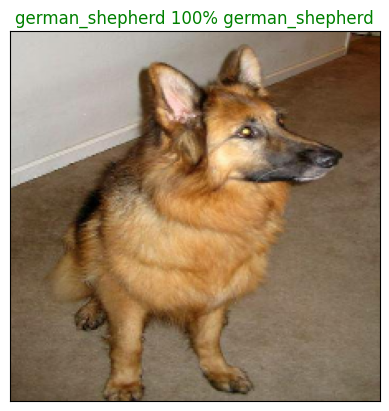

In [73]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=8)

In [74]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

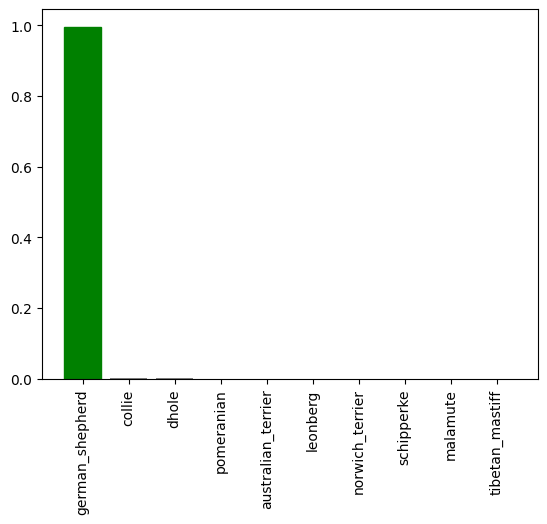

In [75]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=8)

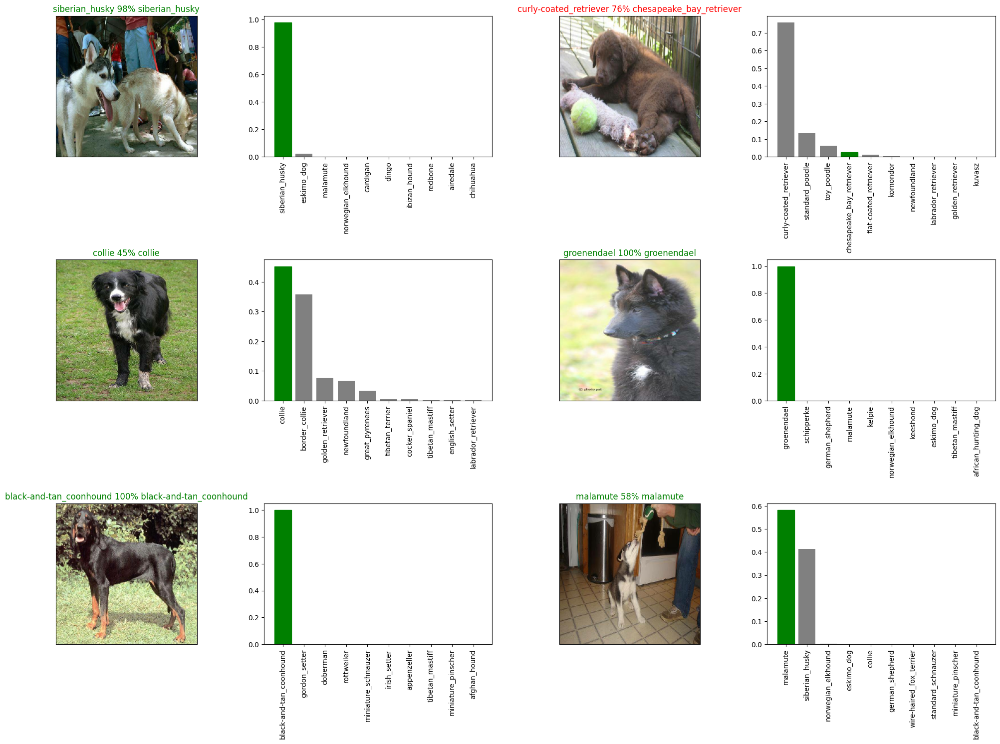

In [76]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [77]:
# Challenge: How would you create a confusion matrix with our models predictions and true labels?

In [78]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  saves a given model in a models directory and appends a suffix (string).
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/dog-vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "_" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [79]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [80]:
# save_model(model, suffix="1000-images-mobilenetv2-Adam")

In [81]:
# This will remove all conflicting packages.
# !pip uninstall -y keras tf-keras tensorflow

In [82]:
# This installs TensorFlow, which brings its own correct Keras version.
# !pip install tensorflow tensorflow_hub

In [83]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Layer

# Define the full path to your saved model
model_path = '/content/drive/MyDrive/dog-vision/models/20250918-20431758228236_1000-images-mobilenetv2-Adam.h5'

# Use the correct TF Hub URL for a 1001-dim output
TF_HUB_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

# --- Define a Wrapper Layer ---
class MobileNetV2FeatureExtractor(Layer):
    """
    A Keras Layer wrapper for the TensorFlow Hub MobileNetV2 feature extractor.
    This ensures full compatibility with Keras Sequential models.
    """
    def __init__(self, name=None, trainable=True, **kwargs):
        super(MobileNetV2FeatureExtractor, self).__init__(name=name, trainable=trainable, **kwargs)
        # Create the hub layer
        self.hub_layer = hub.KerasLayer(TF_HUB_URL, trainable=trainable, name=f"{name}_hub" if name else None)

    def call(self, inputs, training=None):
        return self.hub_layer(inputs)

    def get_config(self):
        config = super(MobileNetV2FeatureExtractor, self).get_config()
        return config

# Register our wrapper class under the key 'MobileNetv2'
custom_objects_dict = {'MobileNetv2': MobileNetV2FeatureExtractor}

# Load the model with the corrected custom object
loaded_1000_image_model = load_model(
    model_path,
    custom_objects=custom_objects_dict
)

print("✅ Model loaded successfully! ✅")
loaded_1000_image_model.summary()

✅ Model loaded successfully! ✅


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobile_netv2_3                  │ (None, 1001)           │             0 │
│ (MobileNetV2FeatureExtractor)   │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 128)            │       128,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 120)            │         7,800 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 144,314 (563.73 KB)

 Trainable params: 144,312 (563.72 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [84]:
model.evaluate(val_data)

32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - accuracy: 0.7686 - loss: 0.9323


[0.9984273314476013, 0.7630000114440918]

In [85]:
len(X), len(y)

(10222, 10222)

In [86]:
X[:10]

['/content/drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [87]:
len(X_train)

4000

In [88]:
# create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [89]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [90]:
# Create a model for full model
full_model = create_model()


Model Summary:


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobile_netv2_2 (MobileNetv2)    │ (None, 1001)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │       128,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 120)            │         7,800 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 144,312 (563.72 KB)

 Trainable params: 144,312 (563.72 KB)

 Non-trainable params: 0 (0.00 B)

In [91]:
# Create full model callbackks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

In [92]:
# The corrected final layer
tf.keras.layers.Dense(120, activation='softmax')

<Dense name=dense_9, built=False>

In [93]:
# --- Shape Inspector Code ---
#
# Purpose: This script checks and prints the output shape of your model
# and compares it to the shape of your dataset's labels.
#
# Instructions:
# 1. Make sure your model variable is named `full_model`.
# 2. Make sure your dataset variable is named `full_data`.
# 3. Run this cell BEFORE you run the `full_model.fit()` cell.

# --- Fixed Shape Inspector Code ---
try:
    model_output_shape = full_model.output_shape
    print(f"🤖 Model's Output Shape: {model_output_shape}")

    for images, labels in full_data.take(1):
        target_label_shape = labels.shape
        print(f"🎯 Target (Label) Shape: {target_label_shape}")

    # ONLY COMPARE THE IMPORTANT PART (THE 120 CLASSES)
    print("-" * 30)
    if model_output_shape[-1] == target_label_shape[-1]:
        print("✅ SUCCESS: Both handle 120 classes!")
    else:
        print(f"❌ REAL MISMATCH: Model={model_output_shape[-1]} classes vs Data={target_label_shape[-1]} classes")

except Exception as e:
    print(f"⚠️ Error checking shapes: {e}")
    print("Make sure 'full_model' and 'full_data' are defined")

🤖 Model's Output Shape: (None, 120)
🎯 Target (Label) Shape: (32, 120)
------------------------------
✅ SUCCESS: Both handle 120 classes!


In [94]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 63s 173ms/step - accuracy: 0.3685 - loss: 2.8965
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 134ms/step - accuracy: 0.8241 - loss: 0.5774
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 135ms/step - accuracy: 0.8966 - loss: 0.3451
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - accuracy: 0.9259 - loss: 0.2444
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 44s 136ms/step - accuracy: 0.9499 - loss: 0.1659
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 44s 136ms/step - accuracy: 0.9707 - loss: 0.1139
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 134ms/step - accuracy: 0.9791 - loss: 0.0804
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 133ms/step - accuracy: 0.9850 - loss: 0.0608
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 134ms/step - accuracy: 0.9900 - loss: 0.0413
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 134ms/step - accuracy: 0.9912 - loss: 0.0368
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 134ms/step - accuracy: 0.9840 - loss: 0.0576
Epoch 12

In [95]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/dog-vision/models/20251112-07391762933142_full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/dog-vision/models/20251112-07391762933142_full-image-set-mobilenetv2-Adam.h5'

In [96]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Layer

# --- 1. Define the Custom Layer Class ---
# This MUST be defined in your script so Keras knows
# what 'MobileNetv2' is when it loads the file.
class MobileNetV2FeatureExtractor(Layer):
    """
    A Keras Layer wrapper for the TensorFlow Hub MobileNetV2 feature extractor.
    """
    def __init__(self, name=None, trainable=True, **kwargs):
        super(MobileNetV2FeatureExtractor, self).__init__(name=name, trainable=trainable, **kwargs)
        # Define the TF Hub URL inside the class
        TF_HUB_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"
        self.hub_layer = hub.KerasLayer(TF_HUB_URL, trainable=trainable, name=f"{name}_hub" if name else None)

    def call(self, inputs, training=None):
        return self.hub_layer(inputs)

    def get_config(self):
        config = super(MobileNetV2FeatureExtractor, self).get_config()
        return config

# --- 2. Define Your Model's Path ---
# This is the path you specified in your last line.
# Make sure this path is correct!
model_path = "/content/drive/MyDrive/dog-vision/models/20251021-09571761040628_full-image-set-mobilenetv2-Adam.h5"
# --- 3. Create the Custom Objects Dictionary ---
# This maps the layer's name (a string) to its class definition.
custom_objects_dict = {'MobileNetv2': MobileNetV2FeatureExtractor}


# --- 4. Load the Model into Your Desired Variable ---
# We use your variable name 'loaded_full_model' and pass the
# 'custom_objects' dictionary to the 'load_model' function.
try:
    print(f"Attempting to load model from: {model_path}")

    # This is the line you want:
    loaded_full_model = load_model(
        model_path,
        custom_objects=custom_objects_dict
    )

    print("✅ Model loaded successfully into 'loaded_full_model'!")

    # You can now use this variable later
    print("Displaying model summary:")
    loaded_full_model.summary()

except Exception as e:
    print(f"❌ An error occurred during model loading: {e}")
    print("Please double-check that your 'model_path' is correct.")

Attempting to load model from: /content/drive/MyDrive/dog-vision/models/20251021-09571761040628_full-image-set-mobilenetv2-Adam.h5


✅ Model loaded successfully into 'loaded_full_model'!
Displaying model summary:


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobile_netv2_2                  │ (None, 1001)           │             0 │
│ (MobileNetV2FeatureExtractor)   │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │       128,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 120)            │         7,800 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 144,314 (563.73 KB)

 Trainable params: 144,312 (563.72 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

## Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames. ✅
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the predict() method called on our model.

Note: Calling predict() on our full model and passing it the test data batch will take a long time to run (about a ~1hr). This is because we have to process ~10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [97]:
!mkdir -p /content/dog-vision-local/test

In [98]:
print("Copying test images... (this may take a minute)")
!cp /content/drive/MyDrive/dog-vision/test/* /content/dog-vision-local/test/
print("Copying complete!")

Copying test images... (this may take a minute)
Copying complete!


In [99]:
import os

test_path = "/content/dog-vision-local/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

print(f"Found {len(test_filenames)} test images.")

Found 10357 test images.


In [102]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [103]:
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step


In [104]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/dog-vision/preds_array.csv", test_predictions, delimiter=",")

In [105]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/dog-vision/preds_array.csv", delimiter=",")

In [106]:
test_predictions[:10]


array([[2.32884076e-07, 8.43761909e-13, 3.63000324e-11, ...,
        7.87876795e-12, 2.41857645e-09, 4.68793633e-06],
       [1.86879197e-20, 7.95677935e-17, 9.99997258e-01, ...,
        1.34381548e-10, 1.53881865e-17, 8.47349757e-18],
       [6.55786393e-14, 2.12771467e-11, 4.08367396e-06, ...,
        1.62170225e-11, 2.97162403e-12, 1.67238693e-14],
       ...,
       [3.80044260e-12, 6.73989162e-18, 3.71590345e-13, ...,
        1.77357896e-17, 6.78809061e-18, 2.76061217e-14],
       [5.69471008e-15, 4.92455412e-19, 8.52740314e-08, ...,
        2.68072906e-08, 1.89587170e-18, 3.54903092e-13],
       [2.82215691e-14, 5.33440152e-06, 1.69424186e-12, ...,
        1.74710317e-06, 8.21860687e-14, 2.69730793e-09]])

In [107]:
test_predictions.shape


(10357, 120)

# Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [108]:
# ["id"] + list(unique_breeds)


In [109]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [110]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [111]:
preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,aa3b0b8a13e8647409b0b49c68afccbd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2e26e93772065ab25b71451b8b5d3d98,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,956ed8e35d52415c709177873454265e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,54aa2836e834e2e5f29d9c5fdd0963e1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,6b53ce7ea9d4ba5ca621c94fabd39c69,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [112]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,aa3b0b8a13e8647409b0b49c68afccbd,2.328841e-07,8.437619e-13,3.630003e-11,2.422136e-12,6.604529e-11,3.249785e-10,3.284902e-02,4.401464e-10,1.563721e-12,...,2.340203e-12,7.534968e-09,2.335576e-14,1.195350e-12,3.388871e-14,1.699750e-14,4.068947e-08,7.878768e-12,2.418576e-09,4.687936e-06
1,2e26e93772065ab25b71451b8b5d3d98,1.868792e-20,7.956779e-17,9.999973e-01,3.404872e-19,2.140352e-11,1.186235e-17,2.838961e-13,1.308631e-14,1.548802e-16,...,4.140298e-19,9.928736e-17,5.553326e-18,7.964606e-19,5.485595e-17,8.782018e-18,1.684056e-11,1.343815e-10,1.538819e-17,8.473498e-18
2,956ed8e35d52415c709177873454265e,6.557864e-14,2.127715e-11,4.083674e-06,9.823846e-11,2.703255e-12,2.075187e-10,1.051879e-09,1.546417e-13,1.767615e-11,...,5.341149e-16,3.026107e-14,1.914025e-14,4.116050e-11,3.972161e-15,6.713114e-13,5.721865e-11,1.621702e-11,2.971624e-12,1.672387e-14
3,54aa2836e834e2e5f29d9c5fdd0963e1,7.512169e-10,1.911777e-08,2.418521e-11,7.179302e-13,9.587971e-12,8.944317e-13,4.399509e-12,5.122152e-17,3.316874e-18,...,1.586405e-10,7.745081e-16,1.794096e-12,2.529680e-16,4.375747e-17,9.076038e-14,6.094887e-14,2.373466e-12,1.884207e-15,1.516951e-12
4,6b53ce7ea9d4ba5ca621c94fabd39c69,1.797533e-17,3.306488e-15,1.151134e-10,1.227598e-18,2.176679e-06,2.365614e-12,5.701320e-15,1.550015e-08,3.770998e-10,...,3.722119e-18,8.462293e-11,3.208856e-15,8.282835e-11,1.488019e-11,5.741025e-13,6.334560e-10,9.999942e-01,3.157052e-12,9.884957e-14


In [113]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("/content/drive/MyDrive/dog-vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

KeyboardInterrupt: 

# Making predictions on custom images
To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [114]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/dog-vision/my-dog-photos"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [115]:
custom_image_paths

['/content/drive/MyDrive/dog-vision/my-dog-photos.ipynb_checkpoints',
 '/content/drive/MyDrive/dog-vision/my-dog-photoscbea772ae896e6427243c174d66dbc30.jpg',
 '/content/drive/MyDrive/dog-vision/my-dog-photos9f776960b5fe247c5cd748caaf53ccd8.jpg',
 '/content/drive/MyDrive/dog-vision/my-dog-photos8fbb1001527613d8aa3c89f4ebfcd192.jpg']

In [116]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [120]:
# Get only the actual image files, excluding checkpoint directories
import os

custom_image_paths = []
custom_path = "/content/drive/MyDrive/dog-vision/my-dog-photos/"

for img_file in os.listdir(custom_path):
    if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
        full_path = os.path.join(custom_path, img_file)
        custom_image_paths.append(full_path)

print(f"Found {len(custom_image_paths)} images")
print("First few paths:", custom_image_paths[:3])

Found 3 images
First few paths: ['/content/drive/MyDrive/dog-vision/my-dog-photos/cbea772ae896e6427243c174d66dbc30.jpg', '/content/drive/MyDrive/dog-vision/my-dog-photos/9f776960b5fe247c5cd748caaf53ccd8.jpg', '/content/drive/MyDrive/dog-vision/my-dog-photos/8fbb1001527613d8aa3c89f4ebfcd192.jpg']


In [121]:
# Filter out any checkpoint directory paths
custom_image_paths = [path for path in custom_image_paths
                      if '.ipynb_checkpoints' not in path and
                      path.lower().endswith(('.jpg', '.jpeg', '.png'))]

print(f"Filtered to {len(custom_image_paths)} valid images")

Filtered to 3 valid images


In [122]:
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_preds = loaded_full_model.predict(custom_data)

Creating test data batches...
1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step


In [123]:
custom_preds.shape

(3, 120)

In [129]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['doberman', 'beagle', 'eskimo_dog']

In [125]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

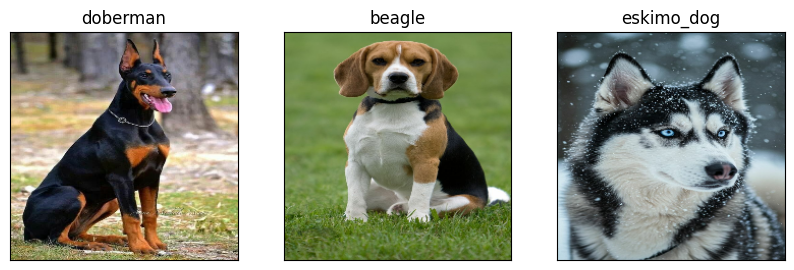

In [126]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)